In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from astra.plot.utils import latexify

kilns = pd.read_csv('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/after_hand_validation_data/gdf_kilns.csv')
kilns['country'].unique()

array(['Afghanistan', 'Pakistan', 'India', 'Bangladesh'], dtype=object)

In [2]:
kilns

,class_name,max_lon,min_lon,max_lat,min_lat,center_lat,center_lon,country
0,FCBK,62.037766,62.035918,30.998087,30.996903,30.997495,62.036842,Afghanistan
1,FCBK,62.056602,62.055932,31.012758,31.011431,31.012094,62.056267,Afghanistan
2,FCBK,65.700962,65.699351,31.542340,31.541305,31.541822,65.700157,Afghanistan
3,FCBK,65.709011,65.707415,31.532492,31.531653,31.532073,65.708213,Afghanistan
4,FCBK,66.335943,66.334383,31.079768,31.078764,31.079266,66.335163,Afghanistan
...,...,...,...,...,...,...,...,...
62666,FCBK,89.493423,89.493036,23.309322,23.308719,23.309020,89.493229,Bangladesh
62667,FCBK,89.604165,89.603876,23.018210,23.017568,23.017889,89.604021,Bangladesh
62668,FCBK,88.964569,88.964104,24.030958,24.030613,24.030786,88.964337,Bangladesh
62669,Zigzag,89.290052,89.289595,23.775597,23.775235,23.775416,89.289823,Bangladesh


In [3]:
india_state_kilns = gpd.read_file('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/after_hand_validation_data/india_v5/final/india_v5.geojson')
afghanistan_state_kilns = gpd.read_file('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/after_hand_validation_data/afghanistan_v5/final/afghanistan.geojson')
pakistan_state_kilns = gpd.read_file('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/after_hand_validation_data/pakistan_v6/final/pakistan_v6.geojson')
bangladesh_state_kilns = gpd.read_file('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/after_hand_validation_data/bangladesh_v4/final/bangladesh_v4.geojson')

In [4]:
len(india_state_kilns) + len(afghanistan_state_kilns)+ len(pakistan_state_kilns)+ len(bangladesh_state_kilns)

62671

In [5]:
!ls /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/after_hand_validation_data/india_v5/final
!ls /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/after_hand_validation_data/afghanistan_v5/final/
!ls /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/after_hand_validation_data/pakistan_v6/final
!ls /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/after_hand_validation_data/bangladesh_v4/final

assam.geojson  gujarat.geojson	 jharkhand.geojson  uttar_pradesh.geojson
bihar.geojson  haryana.geojson	 punjab.geojson     west_bengal.geojson
count.ipynb    india_v5.geojson  rajasthan.geojson
afghanistan.geojson		      farah_v5.geojson	 sari_pul_v5.geojson
afghanistan_remaining_states.geojson  hirat_v5.geojson	 takhar_v5.geojson
balkh_v5.geojson		      kabul_v5.geojson	 zabul_v5.geojson
count.ipynb			      kunduz_v5.geojson
balochistan.geojson  khyber_pakhtunkhwa.geojson  pak_punjab.geojson
count.ipynb	     pakistan_v6.geojson	 sindh.geojson
bangladesh_v4.geojson  count.ipynb     mymensingh.geojson  sylhet.geojson
barisal.geojson        dhaka.geojson   rajshahi.geojson
chittagong.geojson     khulna.geojson  rangpur.geojson


In [6]:
!ls /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/regions/shapes/afghanistan

 badakhshan.geojson   ghor.geojson	 kunduz.geojson      parwan.geojson
 badghis.geojson      hilmand.geojson	 laghman.geojson     samangan.geojson
 baghlan.geojson      hirat.geojson	 logar.geojson	    'sari pul.geojson'
 balkh.geojson	      jawzjan.geojson	 nangarhar.geojson   takhar.geojson
 bamyan.geojson       kabul.geojson	 nimroz.geojson      uruzgan.geojson
 daykundi.geojson     kandahar.geojson	 nuristan.geojson    wardak.geojson
 farah.geojson	      kapisa.geojson	 paktika.geojson     zabul.geojson
 faryab.geojson       khost.geojson	 paktya.geojson
 ghazni.geojson       kunar.geojson	 panjshayr.geojson


In [7]:
bangladesh_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/bangladesh_geojson_shapefile/bgd_adm_bbs_20201113_SHP/bgd_admbnda_adm1_bbs_20201113.shp')
bangladesh_shp.rename(columns={'ADM1_EN': 'state'}, inplace=True)
india_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/India_State_Shapefile/India_State_Shapefile/India_State_Boundary.shp')
india_shp.rename(columns={'Name': 'state'}, inplace=True)

pakistan_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/neurips_2025/pakistan_all_levels_shapefiles/pak_admbnda_adm1_wfp_20220909.shp')
pakistan_shp.rename(columns={'ADM1_EN': 'state'}, inplace=True)
afghanistan_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/neurips_2025/afghanistan.geojson')
afghanistan_shp.rename(columns={'shapeName': 'state'}, inplace=True)
assert bangladesh_shp.crs == india_shp.crs
assert india_shp.crs == pakistan_shp.crs
assert pakistan_shp.crs == afghanistan_shp.crs


In [8]:
four_countries_shp = pd.concat([afghanistan_shp, bangladesh_shp, india_shp, pakistan_shp], ignore_index = True)

In [9]:
kilns_points = gpd.GeoDataFrame(kilns[['class_name', 'center_lat', 'center_lon', 'country']], 
                                             geometry = gpd.points_from_xy(kilns['center_lon'], 
                                                                           kilns['center_lat']),
                                            crs="EPSG:4326")
kilns_points.head(2)

,class_name,center_lat,center_lon,country,geometry
0,FCBK,30.997495,62.036842,Afghanistan,POINT (62.03684 30.9975)
1,FCBK,31.012094,62.056267,Afghanistan,POINT (62.05627 31.01209)


In [10]:
kilns_points

,class_name,center_lat,center_lon,country,geometry
0,FCBK,30.997495,62.036842,Afghanistan,POINT (62.03684 30.9975)
1,FCBK,31.012094,62.056267,Afghanistan,POINT (62.05627 31.01209)
2,FCBK,31.541822,65.700157,Afghanistan,POINT (65.70016 31.54182)
3,FCBK,31.532073,65.708213,Afghanistan,POINT (65.70821 31.53207)
4,FCBK,31.079266,66.335163,Afghanistan,POINT (66.33516 31.07927)
...,...,...,...,...,...
62666,FCBK,23.309020,89.493229,Bangladesh,POINT (89.49323 23.30902)
62667,FCBK,23.017889,89.604021,Bangladesh,POINT (89.60402 23.01789)
62668,FCBK,24.030786,88.964337,Bangladesh,POINT (88.96434 24.03079)
62669,Zigzag,23.775416,89.289823,Bangladesh,POINT (89.28982 23.77542)


In [11]:
merged_country_state_with_kilns = kilns_points.sjoin(four_countries_shp, how="left")


In [12]:
merged_country_state_with_kilns

,class_name,center_lat,center_lon,country,geometry,index_right,state,shapeISO,shapeID,shapeGroup,...,ADM1_PCODE,ADM1_REF,ADM1ALT1EN,ADM1ALT2EN,ADM0_EN,ADM0_PCODE,date,validOn,validTo,Type
0,FCBK,30.997495,62.036842,Afghanistan,POINT (62.03684 30.9975),31.0,Nimruz,AF-NIM,12653393B2934199951965,AFG,...,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
1,FCBK,31.012094,62.056267,Afghanistan,POINT (62.05627 31.01209),31.0,Nimruz,AF-NIM,12653393B2934199951965,AFG,...,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
2,FCBK,31.541822,65.700157,Afghanistan,POINT (65.70016 31.54182),0.0,Kandahar,AF_KAN,12653393B40111500734429,AFG,...,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
3,FCBK,31.532073,65.708213,Afghanistan,POINT (65.70821 31.53207),0.0,Kandahar,AF_KAN,12653393B40111500734429,AFG,...,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
4,FCBK,31.079266,66.335163,Afghanistan,POINT (66.33516 31.07927),0.0,Kandahar,AF_KAN,12653393B40111500734429,AFG,...,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62666,FCBK,23.309020,89.493229,Bangladesh,POINT (89.49323 23.30902),37.0,Khulna,NaN,NaN,NaN,...,BD40,None,None,None,Bangladesh,BD,2015-01-01,2020-11-13,0000/00/00,NaN
62667,FCBK,23.017889,89.604021,Bangladesh,POINT (89.60402 23.01789),37.0,Khulna,NaN,NaN,NaN,...,BD40,None,None,None,Bangladesh,BD,2015-01-01,2020-11-13,0000/00/00,NaN
62668,FCBK,24.030786,88.964337,Bangladesh,POINT (88.96434 24.03079),37.0,Khulna,NaN,NaN,NaN,...,BD40,None,None,None,Bangladesh,BD,2015-01-01,2020-11-13,0000/00/00,NaN
62669,Zigzag,23.775416,89.289823,Bangladesh,POINT (89.28982 23.77542),37.0,Khulna,NaN,NaN,NaN,...,BD40,None,None,None,Bangladesh,BD,2015-01-01,2020-11-13,0000/00/00,NaN


In [13]:
# country_state_with_kilns.drop(country_state_with_kilns[(country_state_with_kilns['class_name'] < 10)].index, inplace=True)
country_state_with_kilns = pd.DataFrame(merged_country_state_with_kilns.groupby('state')[['class_name', 'country']].count())
country_state_with_kilns.reset_index(inplace=True) 
states_with_kilns = pd.Series(country_state_with_kilns['state'].unique())
states_with_kilns = states_with_kilns[~states_with_kilns.isna()]
states_with_kilns
# Group by state while keeping country information
country_state_with_kilns = merged_country_state_with_kilns.groupby(['state', 'country'])[['class_name']].count().reset_index()

# Rename for clarity
country_state_with_kilns.rename(columns={'class_name': 'kiln_count'}, inplace=True)

# Get unique states with kilns
states_with_kilns = pd.Series(country_state_with_kilns['state'].unique()).dropna()

# Display the DataFrame
print(country_state_with_kilns)
# print(states_with_kilns)


                 state      country  kiln_count
0                Assam        India        1354
1         Azad Kashmir     Pakistan           1
2           Badakhshan  Afghanistan           9
3              Badghis  Afghanistan           1
4              Baghlan  Afghanistan          23
5                Balkh  Afghanistan          60
6          Balochistan     Pakistan          65
7               Bamyan  Afghanistan           1
8              Barisal   Bangladesh         365
9                Bihar        India        7486
10          Chittagong   Bangladesh        1325
11            Daykundi  Afghanistan           1
12               Dhaka   Bangladesh        1299
13               Farah  Afghanistan           6
14              Faryab  Afghanistan          30
15              Ghanzi  Afghanistan          12
16                Ghor  Afghanistan           1
17             Gujarat        India        1063
18             Haryana        India        2388
19             Helmand  Afghanistan     

In [14]:
(country_state_with_kilns[country_state_with_kilns['country']=='India'])

,state,country,kiln_count
0,Assam,India,1354
9,Bihar,India,7486
17,Gujarat,India,1063
18,Haryana,India,2388
21,Himachal Pradesh,India,1
23,Jammu and Kashmir,India,1
25,Jharkhand,India,1438
41,Punjab,India,2518
43,Rajasthan,India,2405
51,Uttar Pradesh,India,19902


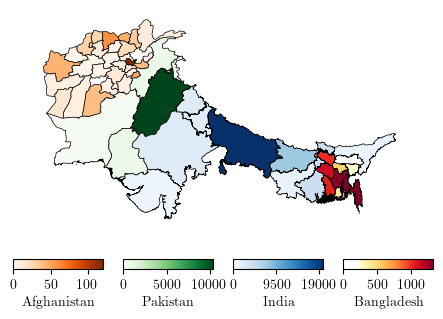

In [40]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
import math
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
from matplotlib import colormaps  # For future-safe colormap access
# Define the colormap for each country
country_colormaps = {
    'Afghanistan': 'Oranges',      # Afghanistan - Blue colormap
    'Pakistan': 'Greens',        # Pakistan - Green colormap
    'India': 'Blues',            # India - Blue colormap
    'Bangladesh': 'YlOrRd'       # Bangladesh - Yellow to Red colormap
}
pakistan_shp = pakistan_shp[pakistan_shp['state'].isin(states_with_kilns)]
afghanistan_shp = afghanistan_shp[afghanistan_shp['state'].isin(states_with_kilns)]
selected_states = [
    'Gujarat',
    'Haryana',
    'West Bengal',
    'Bihar',
    'Uttar Pradesh',
    'Jharkhand',
    'Punjab',
    'Assam',
    'Rajasthan',
    'Delhi'
]

india_merged = india_shp[india_shp['state'].isin(selected_states)]
bangladesh_shp = bangladesh_shp[bangladesh_shp['state'].isin(states_with_kilns)]
# Merge kiln data into each country's shapefile
afghanistan_merged = afghanistan_shp.merge(
    country_state_with_kilns[country_state_with_kilns['country'] == 'Afghanistan'],
    on='state', how='left'
)

pakistan_merged = pakistan_shp.merge(
    country_state_with_kilns[country_state_with_kilns['country'] == 'Pakistan'],
    on='state', how='left'
)

india_merged = india_merged.merge(
    country_state_with_kilns[country_state_with_kilns['country'] == 'India'],
    on='state', how='left'
)

bangladesh_merged = bangladesh_shp.merge(
    country_state_with_kilns[country_state_with_kilns['country'] == 'Bangladesh'],
    on='state', how='left'
)

# Combine all into one GeoDataFrame
combined = pd.concat([
    afghanistan_merged.assign(country='Afghanistan'),
    pakistan_merged.assign(country='Pakistan'),
    india_merged.assign(country='India'),
    bangladesh_merged.assign(country='Bangladesh')
])

# Fill NaNs in kiln_count with 0 for visualization
combined['kiln_count'] = combined['kiln_count'].fillna(0)

latexify(5,5,10)
# Plot setup
fig, ax = plt.subplots()

# Layout config
colorbar_width = 0.18
colorbar_height = 0.02
initial_x = 0.1
spacing = 0.04
colorbar_y = 0.0

def round_down_to_nice(x):
    if x == 121:
        return 100
    if x == 10454:
        return 10000
    if x == 19902:
        return 19000
    if x == 1325:
        return 1000
    

    return x
# Plot each country and add colorbar
for i, (country, colormap) in enumerate(country_colormaps.items()):
    subset = combined[combined['country'] == country]
    norm = mcolors.Normalize(vmin=subset['kiln_count'].min(), vmax=subset['kiln_count'].max())
    cmap = colormaps[colormap]  # ✅ updated

    subset = subset.copy()
    subset['color'] = subset['kiln_count'].apply(lambda x: cmap(norm(x)))
    subset.plot(ax=ax, color=subset['color'], edgecolor='black', linewidth=0.5)
    actual_max = subset['kiln_count'].max()
    rounded_max = round_down_to_nice(actual_max)
    cbar_ax = fig.add_axes([
        initial_x + i * (colorbar_width + spacing),
        colorbar_y,
        colorbar_width,
        colorbar_height
    ])
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, cax=cbar_ax,orientation='horizontal')
    cbar.set_label(f'{country}')
    mid_val = round_down_to_nice(rounded_max / 2)
    cbar.set_ticks([0, mid_val, rounded_max])
    # cbar.set_ticklabels([f'0', f'{mid_val}', f'{rounded_max}'])
    # cbar.ax.tick_params(labelsize=10)

# Colorbar layout config (RIGHT SIDE, STACKED)
# colorbar_x = 0.95         # Right side
# colorbar_width = 0.15     # Narrow horizontal bar
# colorbar_height = 0.03    # Taller than before for readability
# initial_y = 0.5        # Start near top
# vertical_spacing = 0.1  # Space between bars

# for i, (country, colormap) in enumerate(country_colormaps.items()):
#     subset = combined[combined['country'] == country]
#     norm = mcolors.Normalize(vmin=subset['kiln_count'].min(), vmax=subset['kiln_count'].max())
#     cmap = colormaps[colormap]

#     subset = subset.copy()
#     subset['color'] = subset['kiln_count'].apply(lambda x: cmap(norm(x)))
#     subset.plot(ax=ax, color=subset['color'], edgecolor='black', linewidth=0.5)

#     cbar_ax = fig.add_axes([
#         colorbar_x,
#         initial_y - i * (colorbar_height + vertical_spacing),
#         colorbar_width,
#         colorbar_height
#     ])
#     sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
#     sm.set_array([])
#     cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
#     cbar.set_label(f'{country}', fontsize=9)
#     cbar.ax.tick_params(labelsize=8)

# Clean up plot
ax.set_facecolor('white')
ax.axis('off')
# ax.set_title('Brick Kiln Density by State in Each Country', fontsize=16)

# Use subplots_adjust instead of tight_layout
fig.subplots_adjust(bottom=0, top=0.6)

# Save
plt.savefig("kiln_density_map_fixed.png", dpi=600, bbox_inches='tight')
plt.savefig("kiln_density_map_fixed.pdf", dpi=600, bbox_inches='tight')
plt.show()


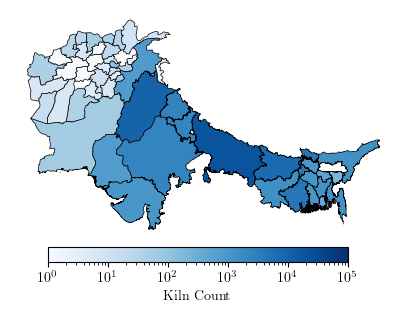

In [42]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
from matplotlib import colormaps

# Filter states
pakistan_shp = pakistan_shp[pakistan_shp['state'].isin(states_with_kilns)]
afghanistan_shp = afghanistan_shp[afghanistan_shp['state'].isin(states_with_kilns)]
selected_states = [
    'Gujarat', 'Haryana', 'West Bengal', 'Bihar',
    'Uttar Pradesh', 'Jharkhand', 'Punjab',
    'Assam', 'Rajasthan', 'Delhi'
]
india_merged = india_shp[india_shp['state'].isin(selected_states)]
bangladesh_shp = bangladesh_shp[bangladesh_shp['state'].isin(states_with_kilns)]

# Merge kiln data
def merge_kilns(shp, country_name):
    return shp.merge(
        country_state_with_kilns[country_state_with_kilns['country'] == country_name],
        on='state', how='left'
    ).assign(country=country_name)

afghanistan_merged = merge_kilns(afghanistan_shp, 'Afghanistan')
pakistan_merged = merge_kilns(pakistan_shp, 'Pakistan')
india_merged = merge_kilns(india_merged, 'India')
bangladesh_merged = merge_kilns(bangladesh_shp, 'Bangladesh')

# Combine
combined = pd.concat([afghanistan_merged, pakistan_merged, india_merged, bangladesh_merged])
combined['kiln_count'] = combined['kiln_count'].fillna(0)

# Setup plot
latexify(5, 5, 10)
fig, ax = plt.subplots()

# Normalize globally across all countries
vmin = combined['kiln_count'].min()
vmax = combined['kiln_count'].max()

# Round vmax to a power of 10
vmax_rounded = 10 ** int(math.ceil(math.log10(vmax)))
vmin_rounded = 1  # Assuming log scale; minimum should not be zero

# Use log normalization for visual clarity over large range
norm = mcolors.LogNorm(vmin=max(vmin_rounded, 1), vmax=vmax_rounded)
cmap = colormaps['Blues']

# Colorize and plot
combined['color'] = combined['kiln_count'].apply(lambda x: cmap(norm(max(x, 1))))
combined.plot(ax=ax, color=combined['color'], edgecolor='black', linewidth=0.5)
# Add single colorbar
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])  # Bottom center
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Kiln Count')

# Tick marks at powers of 10
ticks = [10 ** i for i in range(int(math.log10(vmin_rounded)), int(math.log10(vmax_rounded)) + 1)]
cbar.set_ticks(ticks)
cbar.set_ticklabels([f'$10^{{{int(math.log10(t))}}}$' for t in ticks])

# # Add single colorbar
# cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])  # Bottom center
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# sm.set_array([])

# cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
# cbar.set_label('Kiln Count')

# # Tick marks at powers of 10
# ticks = [10 ** i for i in range(int(math.log10(vmin_rounded)), int(math.log10(vmax_rounded)) + 1)]
# cbar.set_ticks(ticks)
# cbar.set_ticklabels([str(t) for t in ticks])

# Clean layout
ax.set_facecolor('white')
ax.axis('off')
fig.subplots_adjust(bottom=0, top=0.65)

# Save
plt.savefig("kiln_density_map_unified_blue.png", dpi=600, bbox_inches='tight')
plt.savefig("kiln_density_map_unified_blue.pdf", dpi=600, bbox_inches='tight')
plt.show()


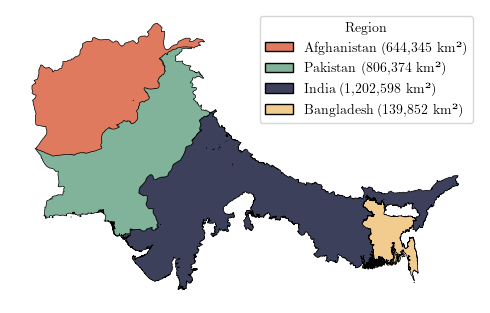

In [19]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Patch




# Define colors
colors = {
    'Afghanistan': '#E07A5F',
    'Pakistan': '#81B29A',
    'India': '#3D405B',
    'Bangladesh': '#F2CC8F'
}
bangladesh_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/bangladesh_geojson_shapefile/bgd_adm_bbs_20201113_SHP/bgd_admbnda_adm1_bbs_20201113.shp')
bangladesh_shp.rename(columns={'ADM1_EN': 'state'}, inplace=True)
india_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/India_State_Shapefile/India_State_Shapefile/India_State_Boundary.shp')
india_shp.rename(columns={'Name': 'state'}, inplace=True)
selected_states = [
    'Gujarat',
    'Haryana',
    'West Bengal',
    'Bihar',
    'Uttar Pradesh',
    'Jharkhand',
    'Punjab',
    'Assam',
    'Rajasthan',
    'Delhi'
]

india_merged = india_shp[india_shp['state'].isin(selected_states)].dissolve()

bangladesh = bangladesh_shp[bangladesh_shp['state'].isin(states_with_kilns)].dissolve()

# Load and dissolve other countries
pakistan_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/neurips_2025/pakistan_all_levels_shapefiles/pak_admbnda_adm1_wfp_20220909.shp')
pakistan_shp.rename(columns={'ADM1_EN': 'state'}, inplace=True)
afghanistan_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/neurips_2025/afghanistan.geojson')
afghanistan_shp.rename(columns={'shapeName': 'state'}, inplace=True)
pakistan = pakistan_shp[pakistan_shp['state'].isin(states_with_kilns)].dissolve()
afghanistan = afghanistan_shp.dissolve()

# Reproject to equal-area CRS (EPSG:6933) for area calculation
india_area = india_merged.to_crs(epsg=6933)
pakistan_area = pakistan.to_crs(epsg=6933)
afghanistan_area = afghanistan.to_crs(epsg=6933)
bangladesh_area = bangladesh.to_crs(epsg=6933)

# Calculate area in km²
area_km2 = {
    "India": india_area.geometry.area.sum() / 1e6,
    "Pakistan": pakistan_area.geometry.area.sum() / 1e6,
    "Afghanistan": afghanistan_area.geometry.area.sum() / 1e6,
    "Bangladesh": bangladesh_area.geometry.area.sum() / 1e6
}

# Plot
latexify(5, 5, 10)
fig, ax = plt.subplots()
india_merged.plot(ax=ax, color=colors["India"], edgecolor="black", linewidth=0.5)
bangladesh.plot(ax=ax, color=colors["Bangladesh"], edgecolor="black", linewidth=0.5)
pakistan.plot(ax=ax, color=colors["Pakistan"], edgecolor="black", linewidth=0.5)
afghanistan.plot(ax=ax, color=colors["Afghanistan"], edgecolor="black", linewidth=0.5)
def annotate_area(gdf, label, ax, y_offset_deg=0.0):
    # Reproject to equal-area CRS for centroid calculation
    gdf_proj = gdf.to_crs(epsg=6933)
    centroid_proj = gdf_proj.geometry.centroid.iloc[0]

    # Convert centroid back to original CRS (EPSG:4326)
    centroid_latlon = gpd.GeoSeries([centroid_proj], crs="EPSG:6933").to_crs("EPSG:4326").geometry.iloc[0]

    # Apply offset in degrees (small value)
    ax.annotate(
        f"{area_km2[label]:,.0f} km²",
        xy=(centroid_latlon.x, centroid_latlon.y + y_offset_deg),
        ha='center', va='center',
        color='white', fontsize=4, weight='bold'
    )


# Apply annotations (India shifted slightly upward)
# annotate_area(india_merged, "India", ax,y_offset_deg=1.4)  # You can adjust upward shift if needed
# annotate_area(pakistan, "Pakistan", ax)
# annotate_area(afghanistan, "Afghanistan", ax)
# annotate_area(bangladesh, "Bangladesh", ax,y_offset_deg=0.8) 


# # Legend
# legend_elements = [
#     Patch(facecolor=colors["Afghanistan"], edgecolor='black', label='Afghanistan'),
#     Patch(facecolor=colors["Pakistan"], edgecolor='black', label='Pakistan'),
#     Patch(facecolor=colors["India"], edgecolor='black', label='India'),
#     Patch(facecolor=colors["Bangladesh"], edgecolor='black', label='Bangladesh'),
# ]
# Legend with area info
legend_elements = [
    Patch(facecolor=colors["Afghanistan"], edgecolor='black', label=f'Afghanistan ({area_km2["Afghanistan"]:,.0f} km²)'),
    Patch(facecolor=colors["Pakistan"], edgecolor='black', label=f'Pakistan ({area_km2["Pakistan"]:,.0f} km²)'),
    Patch(facecolor=colors["India"], edgecolor='black', label=f'India ({area_km2["India"]:,.0f} km²)'),
    Patch(facecolor=colors["Bangladesh"], edgecolor='black', label=f'Bangladesh ({area_km2["Bangladesh"]:,.0f} km²)'),
]

ax.legend(handles=legend_elements, loc="upper right", title="Region")

# Final plot tweaks
ax.axis('off')
# plt.title("Brick Kiln Coverage by Region", fontsize=16)
plt.tight_layout()
plt.show()
fig.savefig('regions_covered.png', dpi=600, bbox_inches='tight')
fig.savefig("regions_covered.pdf", dpi=600, bbox_inches='tight')


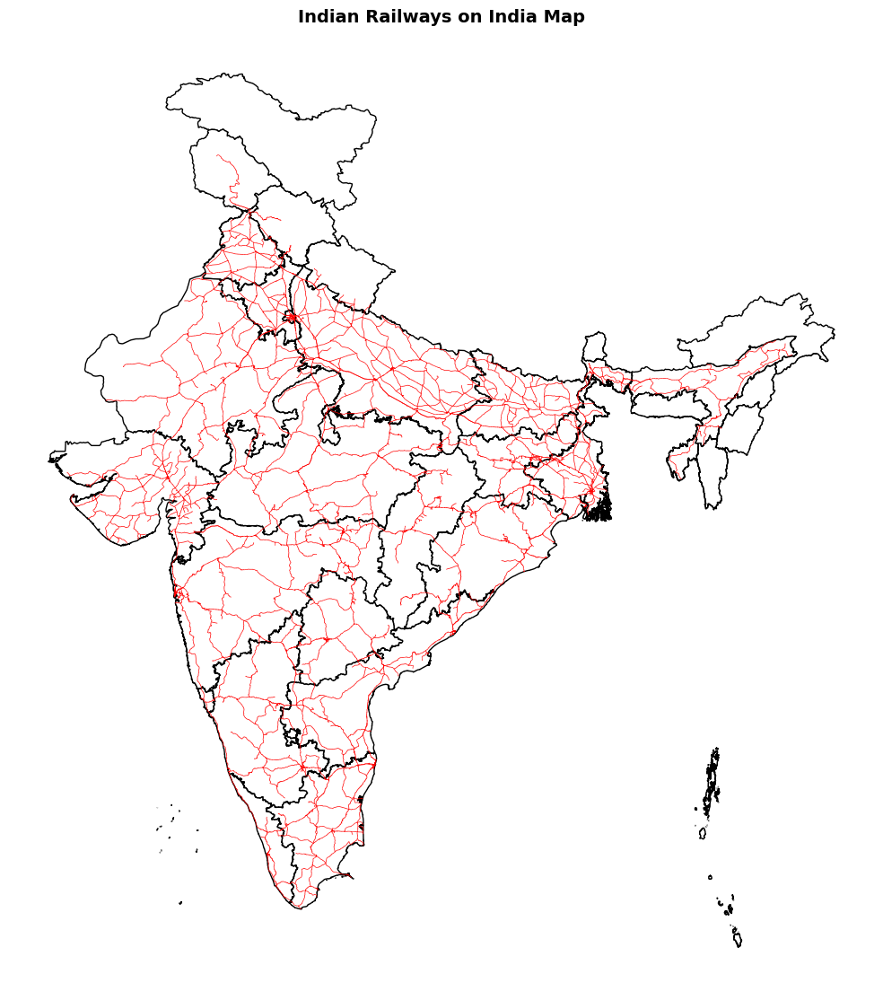

In [35]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load India state boundary shapefile
india_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/India_State_Shapefile/India_State_Shapefile/India_State_Boundary.shp')
india_shp.rename(columns={'Name': 'state'}, inplace=True)

# Load Indian Railways GeoJSON
indian_railways = gpd.read_file('/home/heer.kubadia/Brick_kilns_Heer/INDIAN_RAILWAYS.geojson')

# Plot
fig, ax = plt.subplots(figsize=(10, 12))
india_shp.plot(ax=ax, color='white', edgecolor='black')
indian_railways.plot(ax=ax, color='red', linewidth=0.5)

ax.set_title('Indian Railways on India Map', fontsize=14)
ax.axis('off')
plt.tight_layout()
plt.show()


In [39]:
india_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/India_State_Shapefile/India_State_Shapefile/India_State_Boundary.shp')
# india_shp[0]

In [40]:
india_west_bengal = india_shp[india_shp['Name'] == 'West Bengal']
display(india_west_bengal[["geometry"]])

,geometry
0,"MULTIPOLYGON (((88.01861 21.57278, 88.01889 21..."


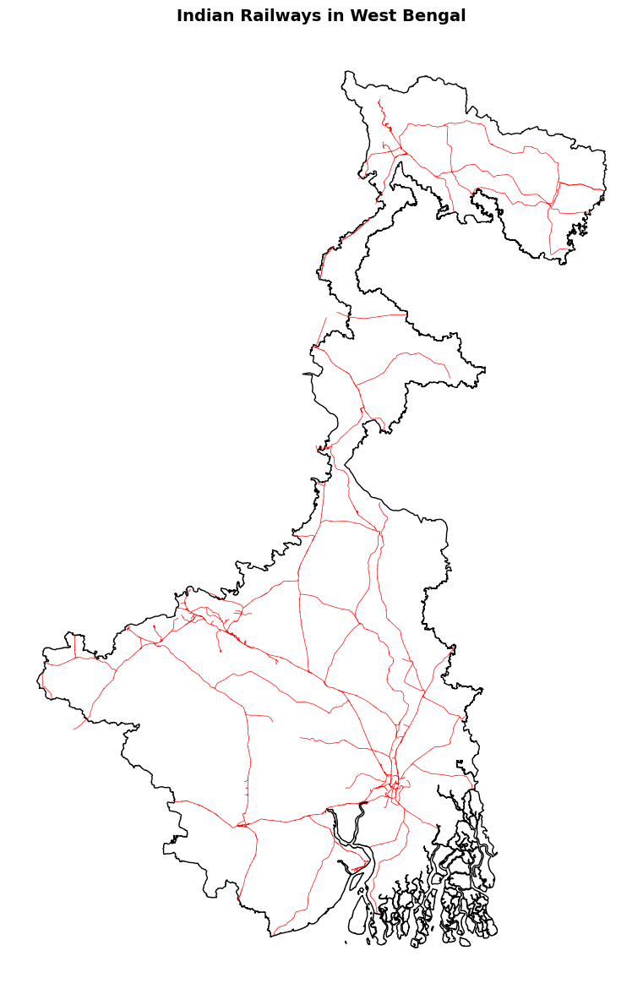

In [43]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Extract West Bengal
india_west_bengal = india_shp[india_shp['Name'] == 'West Bengal']

# Ensure both layers use same CRS
indian_railways = indian_railways.to_crs(india_west_bengal.crs)

# Spatial join to get railways within West Bengal
railways_wb = gpd.sjoin(indian_railways, india_west_bengal, how="inner", predicate="intersects")

# Plot
fig, ax = plt.subplots(figsize=(10, 12))
india_west_bengal.plot(ax=ax, color='white', edgecolor='black')
railways_wb.plot(ax=ax, color='red', linewidth=0.5)
ax.set_title('Indian Railways in West Bengal', fontsize=14)
ax.axis('off')
plt.tight_layout()
plt.show()


In [45]:
print(railways_wb)

              ID                     TRK_NME FTR_CRY CITY_NME      STT_NME  \
2591   150163201                        None      BG     None        Assam   
2592   150125625                        None      BG     None        Assam   
3067   150113241  Raghunathpur to Radhikapur      BG     None        Bihar   
3727   150113410  Raghunathpur to Radhikapur      BG     None        Bihar   
8930   150164234                        None      BG     None    Jharkhand   
...          ...                         ...     ...      ...          ...   
29942  150125801                        None      BG     None  West Bengal   
29943  150125872                        None      BG     None  West Bengal   
29944  150127374                        None      MG     None  West Bengal   
29945  150129838                        None      BG     None  West Bengal   
29946  150132970                        None      MG     None  West Bengal   

              SHAPE_Leng                                       

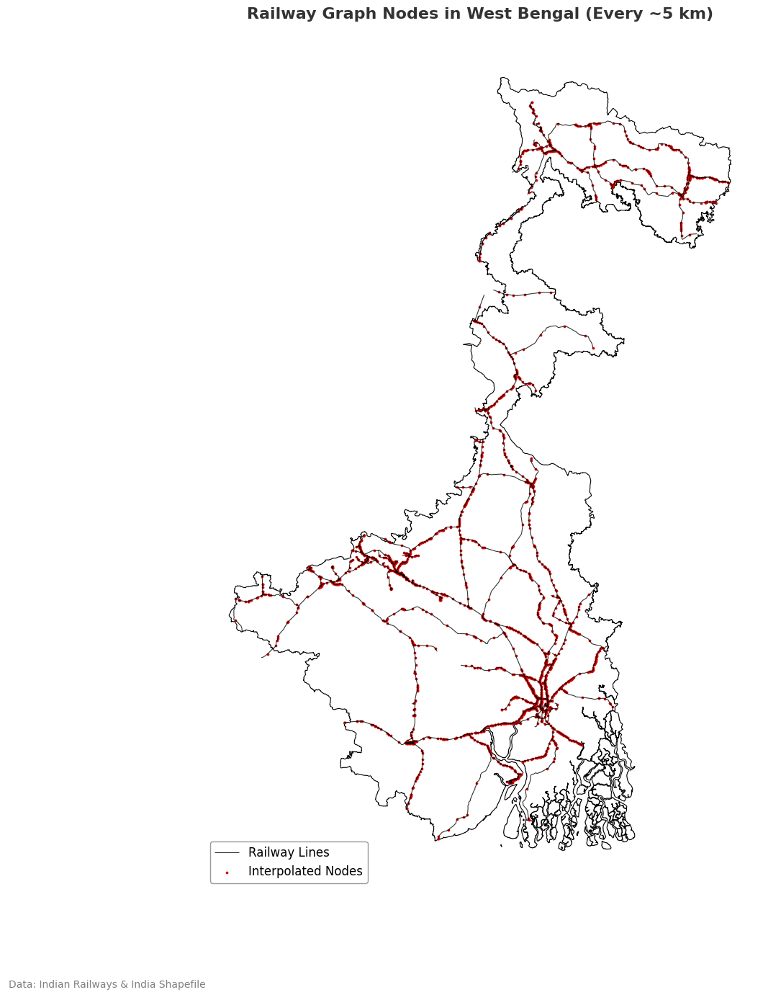

In [26]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import numpy as np
import matplotlib.patheffects as pe

# --- Setup ---
plt.rcParams.update({
    "font.size": 12,
    "axes.edgecolor": "white",
    "axes.facecolor": "#f7f7f7",
    "axes.titleweight": "bold",
    "axes.titlesize": 16
})

# --- Interpolation function ---
def interpolate_points(geom, interval=5000):
    if geom.length < interval:
        return [geom.interpolate(0.5, normalized=True)]
    num_points = int(geom.length // interval)
    return [geom.interpolate(dist) for dist in np.linspace(0, geom.length, num_points + 1)]

# --- Load & filter data ---
india_west_bengal = india_shp[india_shp['Name'] == 'West Bengal']
indian_railways = indian_railways.to_crs(india_west_bengal.crs)
railways_wb = gpd.sjoin(indian_railways, india_west_bengal, how="inner", predicate="intersects")

# --- Interpolate nodes ---
interpolated_nodes = []
for line in railways_wb.geometry:
    if line.geom_type == "LineString":
        interpolated_nodes.extend(interpolate_points(line))
    elif line.geom_type == "MultiLineString":
        for part in line.geoms:
            interpolated_nodes.extend(interpolate_points(part))
nodes_gdf = gpd.GeoDataFrame(geometry=interpolated_nodes, crs=railways_wb.crs)

# --- Plotting ---
fig, ax = plt.subplots(figsize=(12, 14), dpi=100)
india_west_bengal.plot(ax=ax, color="#ffffff", edgecolor="black", linewidth=0.8)
railways_wb.plot(ax=ax, color="#000000", linewidth=0.8, label="Railway Lines", alpha=0.8)
nodes_gdf.plot(ax=ax, color="#ce0000", markersize=3, label="Interpolated Nodes", alpha=0.9)

# Style enhancements
ax.set_title("Railway Graph Nodes in West Bengal (Every ~5 km)", pad=20, color="#333333")
ax.axis('off')
ax.legend(loc="lower left", frameon=True, facecolor="white", edgecolor="gray")

# Add background effect
for spine in ax.spines.values():
    spine.set_visible(False)

# Annotated source (optional)
plt.annotate("Data: Indian Railways & India Shapefile", xy=(0.01, 0.01),
             xycoords='figure fraction', ha='left', va='bottom',
             fontsize=10, color='gray')

plt.tight_layout()
plt.show()


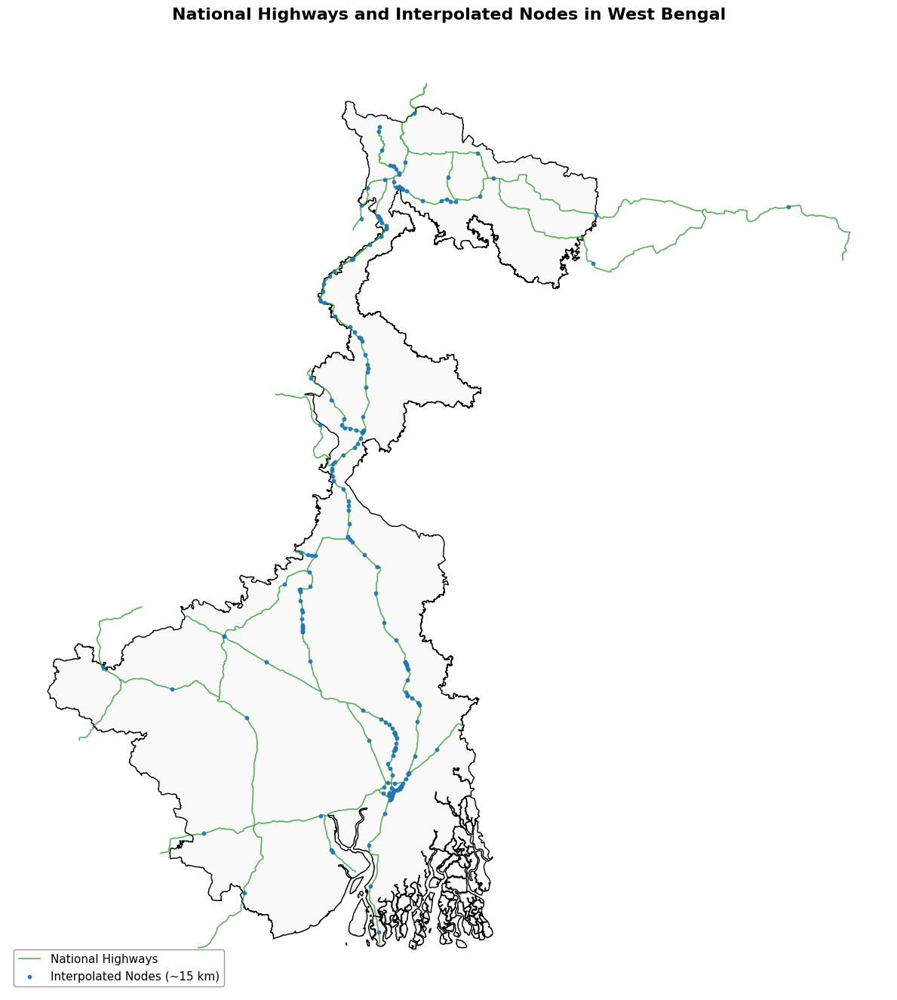

In [3]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

# Load data
india_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/India_State_Shapefile/India_State_Shapefile/India_State_Boundary.shp')
india_shp.rename(columns={'Name': 'state'}, inplace=True)
indian_highways = gpd.read_file('/home/heer.kubadia/Brick_kilns_Heer/INDIA_NATIONAL_HIGHWAY.geojson')

# Filter West Bengal
india_west_bengal = india_shp[india_shp['state'] == 'West Bengal']

# Align CRS
indian_highways = indian_highways.to_crs(india_west_bengal.crs)

# Spatial join to get highways in West Bengal
highways_wb = gpd.sjoin(indian_highways, india_west_bengal, how="inner", predicate="intersects")

# Function to interpolate points
def interpolate_points(geom, interval=15000):
    if geom.length < interval:
        return [geom.interpolate(0.5, normalized=True)]
    distances = np.arange(0, geom.length, interval)
    return [geom.interpolate(d) for d in distances]

# Interpolate points for each highway
interpolated_highway_nodes = []
for geom in highways_wb.geometry:
    if geom.geom_type == "LineString":
        interpolated_highway_nodes.extend(interpolate_points(geom))
    elif geom.geom_type == "MultiLineString":
        for part in geom.geoms:
            interpolated_highway_nodes.extend(interpolate_points(part))

# Create GeoDataFrame of nodes
highway_nodes_gdf = gpd.GeoDataFrame(geometry=interpolated_highway_nodes, crs=highways_wb.crs)

# Plot
fig, ax = plt.subplots(figsize=(12, 14), dpi=100)
india_west_bengal.plot(
    ax=ax,
    color="#f9f9f9",
    edgecolor="black",
    linewidth=1,
    zorder=1
)
highways_wb.plot(
    ax=ax,
    color="#2ca02c",
    linewidth=1.2,
    alpha=0.8,
    label="National Highways",
    zorder=2
)
highway_nodes_gdf.plot(
    ax=ax,
    color="#1f77b4",
    markersize=10,
    alpha=0.9,
    label="Interpolated Nodes (~15 km)",
    zorder=3
)
ax.set_title("National Highways and Interpolated Nodes in West Bengal", fontsize=16, weight='bold', pad=20)
ax.axis('off')
ax.legend(loc="lower left", facecolor="white", frameon=True, edgecolor="gray", fontsize=11)
plt.tight_layout()
plt.show()


In [4]:

railways_station=gpd.read_file("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/domain_experiment/railways/stations.json")
railways_station

,state,code,name,zone,address,geometry
0,Rajasthan,BDHL,Badhal,NWR,"Kishangarh Renwal, Rajasthan",POINT (75.45165 27.25206)
1,None,XX-BECE,XX-BECE,None,None,None
2,None,XX-BSPY,XX-BSPY,None,None,None
3,None,YY-BPLC,YY-BPLC,None,None,None
4,Uttar Pradesh,KHH,KICHHA,NER,"Kichha, Uttar Pradesh",POINT (79.51975 28.91343)
...,...,...,...,...,...,...
8985,None,SAMT,SALEM MARKET,None,None,POINT (78.14262 11.65408)
8986,None,OML,OMALUR,None,None,POINT (78.04678 11.73855)
8987,None,TOS,TOLASAMPATTI,None,None,POINT (77.97955 11.76162)
8988,None,MCRD,MECHERI ROAD,None,None,POINT (77.92186 11.80421)


In [6]:
# Drop rows where geometry is None
railway_points = railways_station[railways_station.geometry.notnull()].copy()
railway_points

,state,code,name,zone,address,geometry
0,Rajasthan,BDHL,Badhal,NWR,"Kishangarh Renwal, Rajasthan",POINT (75.45165 27.25206)
4,Uttar Pradesh,KHH,KICHHA,NER,"Kichha, Uttar Pradesh",POINT (79.51975 28.91343)
5,Rajasthan,SRKN,Sherekan,NWR,"MDR 89, Rajasthan",POINT (74.43499 29.5552)
6,Rajasthan,BKKA,Bhukarka,NWR,"Bhukarka, Rajasthan",POINT (74.75103 29.23823)
7,Rajasthan,NHR,Nohar,NWR,"State Highway 36, Rajasthan",POINT (74.77363 29.19256)
...,...,...,...,...,...,...
8985,None,SAMT,SALEM MARKET,None,None,POINT (78.14262 11.65408)
8986,None,OML,OMALUR,None,None,POINT (78.04678 11.73855)
8987,None,TOS,TOLASAMPATTI,None,None,POINT (77.97955 11.76162)
8988,None,MCRD,MECHERI ROAD,None,None,POINT (77.92186 11.80421)


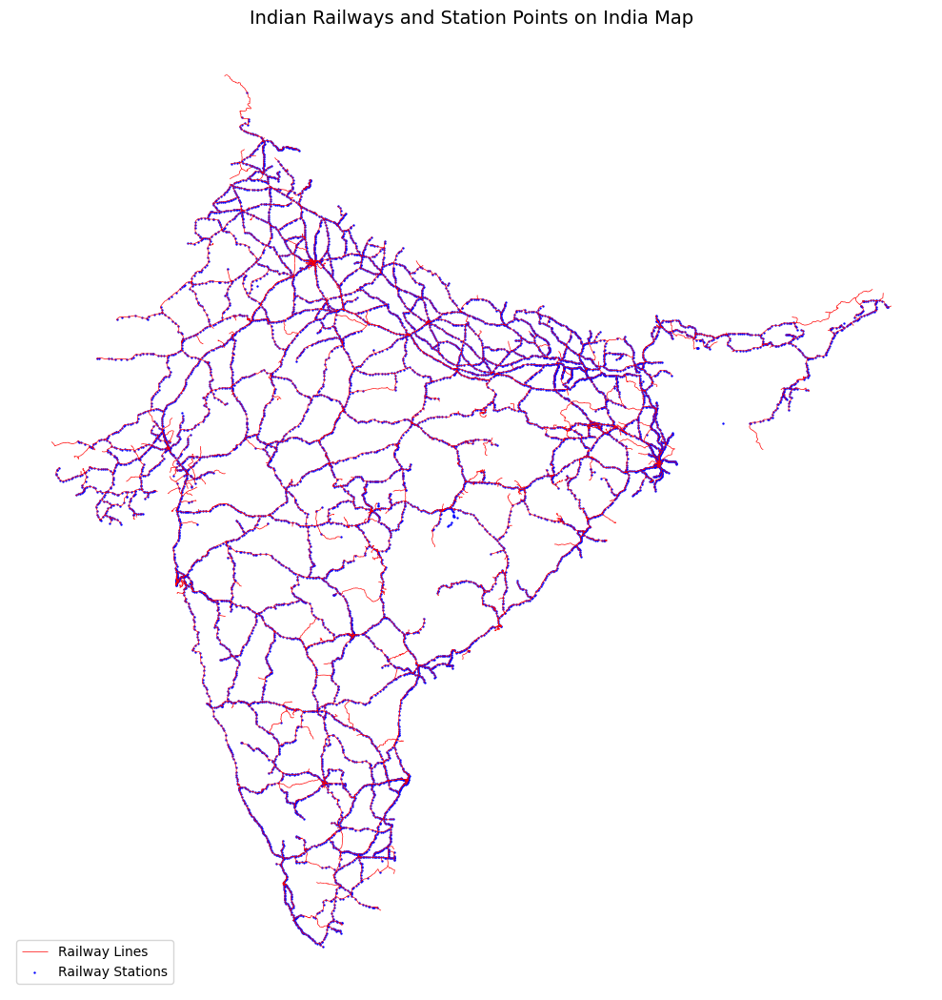

In [9]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load India state boundary shapefile
india_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/India_State_Shapefile/India_State_Shapefile/India_State_Boundary.shp')
india_shp.rename(columns={'Name': 'state'}, inplace=True)

# Load Indian Railways GeoJSON (lines)
indian_railways = gpd.read_file('/home/heer.kubadia/Brick_kilns_Heer/INDIAN_RAILWAYS.geojson')

# Load railway points dataset

# Drop rows with missing geometry
railway_points = railway_points[railway_points.geometry.notnull()].copy()

# Align CRS if needed
railway_points = railway_points.to_crs(india_shp.crs)

# Plot
fig, ax = plt.subplots(figsize=(10, 12))
# india_shp.plot(ax=ax, color='white', edgecolor='black')
indian_railways.plot(ax=ax, color='red', linewidth=0.5, label='Railway Lines')
railway_points.plot(ax=ax, color='blue', markersize=0.5, label='Railway Stations')

ax.set_title('Indian Railways and Station Points on India Map', fontsize=14)
ax.axis('off')
ax.legend(loc='lower left')
plt.tight_layout()
plt.show()


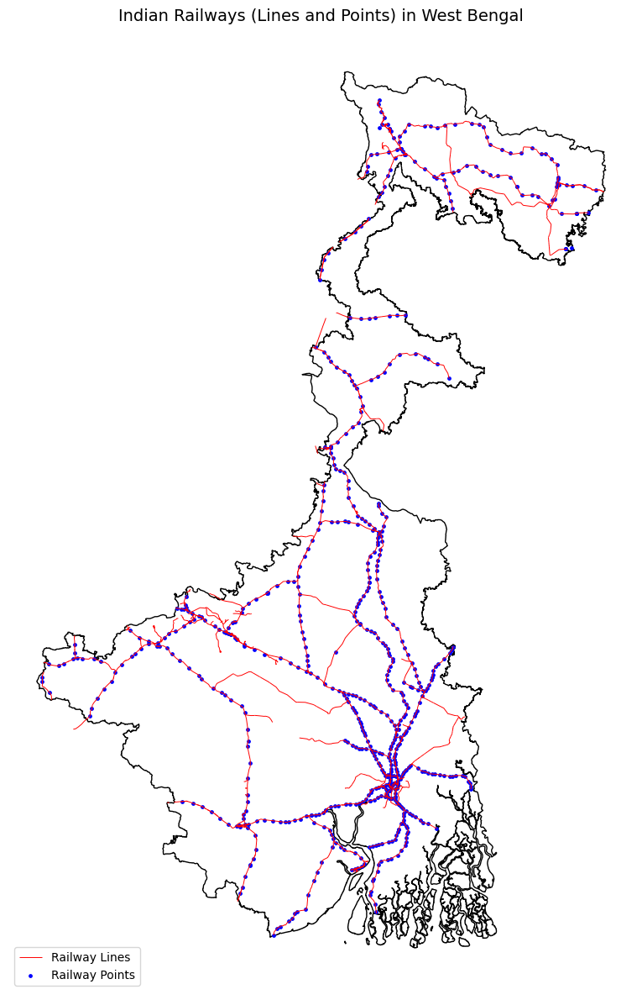

In [10]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load state boundaries and railway line data
india_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/India_State_Shapefile/India_State_Shapefile/India_State_Boundary.shp')
india_shp.rename(columns={'Name': 'state'}, inplace=True)
indian_railways = gpd.read_file('/home/heer.kubadia/Brick_kilns_Heer/INDIAN_RAILWAYS.geojson')

# Load railway point data
railway_points = railway_points[railway_points.geometry.notnull()].copy()

# Extract West Bengal
india_west_bengal = india_shp[india_shp['state'] == 'West Bengal']

# Ensure CRS match
indian_railways = indian_railways.to_crs(india_west_bengal.crs)
railway_points = railway_points.to_crs(india_west_bengal.crs)

# Extract railway lines in West Bengal
railways_wb = gpd.sjoin(indian_railways, india_west_bengal, how="inner", predicate="intersects")

# Extract railway points in West Bengal
railway_points_wb = gpd.sjoin(railway_points, india_west_bengal, how="inner", predicate="intersects")

# Plot
fig, ax = plt.subplots(figsize=(10, 12))
india_west_bengal.plot(ax=ax, color='white', edgecolor='black', linewidth=1)
railways_wb.plot(ax=ax, color='red', linewidth=0.7, label='Railway Lines')
railway_points_wb.plot(ax=ax, color='blue', markersize=6, label='Railway Points')

ax.set_title('Indian Railways (Lines and Points) in West Bengal', fontsize=14)
ax.axis('off')
ax.legend(loc='lower left')
plt.tight_layout()
plt.show()


In [12]:
import geopandas as gpd
import geemap.foliumap as geemap

# Load shapefiles
india_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/India_State_Shapefile/India_State_Shapefile/India_State_Boundary.shp')
india_shp.rename(columns={'Name': 'state'}, inplace=True)
indian_railways = gpd.read_file('/home/heer.kubadia/Brick_kilns_Heer/INDIAN_RAILWAYS.geojson')

# Filter West Bengal
india_west_bengal = india_shp[india_shp['state'] == 'West Bengal']
railway_points = railway_points[railway_points.geometry.notnull()].copy()

# Ensure same CRS
crs = india_west_bengal.crs
indian_railways = indian_railways.to_crs(crs)
railway_points = railway_points.to_crs(crs)

# Filter features in West Bengal
railways_wb = gpd.sjoin(indian_railways, india_west_bengal, how="inner", predicate="intersects")
railway_points_wb = gpd.sjoin(railway_points, india_west_bengal, how="inner", predicate="intersects")

# Initialize interactive map
m = geemap.Map(center=[23.5, 88.3], zoom=7)
m.add_gdf(india_west_bengal, layer_name="West Bengal Boundary", style={"fillOpacity": 0, "color": "black"})
m.add_gdf(railways_wb, layer_name="Railway Lines", style={"color": "red"})
m.add_gdf(railway_points_wb, layer_name="Railway Stations", style={"radius": 4, "color": "blue", "fillColor": "blue"})

m.add_legend(title="Indian Railways in West Bengal", legend_dict={
    "West Bengal": "black",
    "Railway Lines": "red",
    "Railway Stations": "blue"
})

m


In [19]:
from shapely.geometry import LineString, MultiLineString
import geopandas as gpd

indian_railways_train = gpd.read_file('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/domain_experiment/railways/trains.json')


GEOSException: IllegalArgumentException: point array must contain 0 or >1 elements


In [ ]:
import geopandas as gpd
import networkx as nx
from shapely.geometry import LineString, MultiLineString, Point
import matplotlib.pyplot as plt

# Step 1: Load shapefiles and filter West Bengal
india_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/India_State_Shapefile/India_State_Shapefile/India_State_Boundary.shp')
india_shp.rename(columns={'Name': 'state'}, inplace=True)
indian_railways = gpd.read_file('/home/heer.kubadia/Brick_kilns_Heer/INDIAN_RAILWAYS.geojson')
india_west_bengal = india_shp[india_shp['state'] == 'West Bengal']

# Ensure same CRS
crs = india_west_bengal.crs
indian_railways = indian_railways.to_crs(crs)

# Filter features in West Bengal
railways_wb = gpd.sjoin(indian_railways, india_west_bengal, how="inner", predicate="intersects")

# Step 2: Build a graph from railway lines
G = nx.Graph()

for geom in railways_wb.geometry:
    # print(geom)
    # print()
    if isinstance(geom, LineString):
        coords = list(geom.coords)
        # print(coords)
        for i in range(len(coords) - 1):
            p1 = tuple(coords[i])
            print("p1",p1)
            # print()
            p2 = tuple(coords[i + 1])
            # print("p2",p2)
            dist = Point(p1).distance(Point(p2))
            # print("dist",dist)
            G.add_edge(p1, p2, weight=dist)
    elif isinstance(geom, MultiLineString):
        print("MultiLineString")
        print(geom)
        for part in geom.geoms:
            coords = list(part.coords)
            for i in range(len(coords) - 1):
                p1 = tuple(coords[i])
                p2 = tuple(coords[i + 1])
                dist = Point(p1).distance(Point(p2))
                G.add_edge(p1, p2, weight=dist)

# # Step 3: Plot the geometric graph on top of West Bengal
# fig, ax = plt.subplots(figsize=(10, 12))
# # india_west_bengal.plot(ax=ax, facecolor='white', edgecolor='black', linewidth=1)

# # Draw railway edges
# # for u, v in G.edges():
# #     xs = [u[0], v[0]]
# #     ys = [u[1], v[1]]
# #     ax.plot(xs, ys, color='red', linewidth=0.5)

# # Draw nodes
# node_xs, node_ys = zip(*G.nodes())
# ax.scatter(node_xs, node_ys, color='blue', s=5)

# ax.set_title("Geometric Railway Graph in West Bengal", fontsize=14)
# ax.axis('off')
# plt.tight_layout()
# plt.show()
nx.draw(G, with_labels=True, node_size=10, node_color='blue', edge_color='red', width=0.5)
plt.savefig("railway_graph_west_bengal.png", dpi=300, bbox_inches='tight')
plt.savefig("railway_graph_west_bengal.pdf", bbox_inches='tight')
plt.show()

p1 (89.73808400000007, 26.306958000000066)
p1 (89.72549800000007, 26.306685000000073)
p1 (87.95326200000005, 25.656736000000024)
p1 (87.95523100000008, 25.657156000000043)
p1 (87.95637800000009, 25.657380000000046)
p1 (87.95714200000003, 25.65751300000005)
p1 (87.95828300000005, 25.657636000000025)
p1 (87.95885600000008, 25.657639000000074)
p1 (87.95959400000004, 25.65759900000006)
p1 (87.96087400000005, 25.657400000000052)
p1 (87.96151400000008, 25.657216000000062)
p1 (87.96236700000009, 25.656904000000054)
p1 (87.96337800000003, 25.656490000000076)
p1 (87.96528200000006, 25.65571300000005)
p1 (87.96778800000004, 25.65467300000006)
p1 (87.97100100000006, 25.65335200000004)
p1 (87.97527400000007, 25.651614000000052)
p1 (87.97753500000005, 25.65068800000006)
p1 (87.97985700000004, 25.649757000000022)
p1 (87.98238500000008, 25.64871900000003)
p1 (87.98370700000004, 25.648186000000067)
p1 (87.98500100000007, 25.647654000000045)
p1 (87.98701400000004, 25.64686400000005)
p1 (87.987805000000

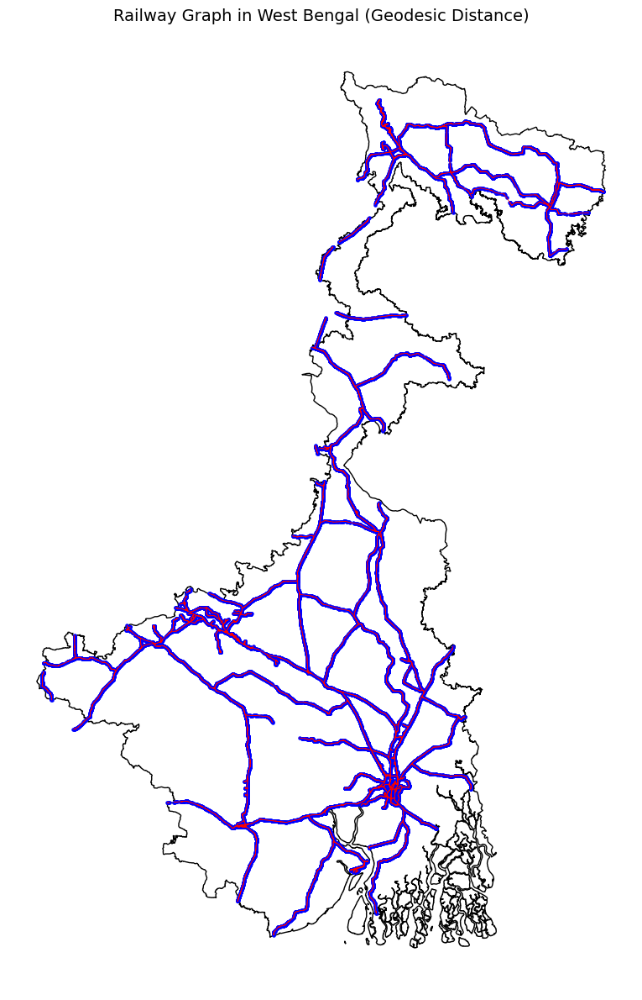

In [29]:
import geopandas as gpd
import networkx as nx
from shapely.geometry import LineString, MultiLineString
from geopy.distance import geodesic
import matplotlib.pyplot as plt

# Load shapefiles and filter West Bengal
india_shp = gpd.read_file('/home/shataxi.dubey/shataxi_work/India_State_Shapefile/India_State_Shapefile/India_State_Boundary.shp')
india_shp.rename(columns={'Name': 'state'}, inplace=True)
indian_railways = gpd.read_file('/home/heer.kubadia/Brick_kilns_Heer/INDIAN_RAILWAYS.geojson')
india_west_bengal = india_shp[india_shp['state'] == 'West Bengal']

# Ensure same CRS (keep it as WGS84 for geodesic)
indian_railways = indian_railways.to_crs(india_west_bengal.crs)

# Filter railway segments intersecting West Bengal
railways_wb = gpd.sjoin(indian_railways, india_west_bengal, how="inner", predicate="intersects")

# Build graph with geodesic distances
G = nx.Graph()

for geom in railways_wb.geometry:
    if isinstance(geom, LineString):
        coords = list(geom.coords)
        for i in range(len(coords) - 1):
            p1 = tuple(reversed(coords[i]))     # lat, lon
            p2 = tuple(reversed(coords[i + 1])) # lat, lon
            dist = geodesic(p1, p2).meters
            G.add_edge(coords[i], coords[i + 1], weight=dist)
    elif isinstance(geom, MultiLineString):
        for part in geom.geoms:
            coords = list(part.coords)
            for i in range(len(coords) - 1):
                p1 = tuple(reversed(coords[i]))
                p2 = tuple(reversed(coords[i + 1]))
                dist = geodesic(p1, p2).meters
                G.add_edge(coords[i], coords[i + 1], weight=dist)

# Plotting
fig, ax = plt.subplots(figsize=(10, 12))
india_west_bengal.plot(ax=ax, facecolor='white', edgecolor='black', linewidth=1)

# Edges
for u, v in G.edges():
    xs = [u[0], v[0]]
    ys = [u[1], v[1]]
    ax.plot(xs, ys, color='red', linewidth=0.5)

# Nodes
node_xs, node_ys = zip(*G.nodes())
ax.scatter(node_xs, node_ys, color='blue', s=5)

ax.set_title("Railway Graph in West Bengal (Geodesic Distance)", fontsize=14)
ax.axis('off')
plt.tight_layout()
plt.show()
